In [6]:
# for loading/processing the images  
import tensorflow as tf

from keras.preprocessing.image import load_img 
from keras.preprocessing.image import img_to_array 
from keras.applications.resnet_v2 import preprocess_input 

# models 
from tensorflow.keras.applications import VGG16,VGG19,ResNet101V2
from keras.models import Model



# for everything else
import os
import numpy as np
import matplotlib.pyplot as plt
from random import randint
import pandas as pd
import pickle

from sklearn.metrics import confusion_matrix, classification_report, accuracy_score,f1_score,recall_score,cohen_kappa_score,precision_score,homogeneity_score,silhouette_score,roc_curve,roc_auc_score


In [1]:
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


In [2]:
!unzip "/content/drive/My Drive/dataset_sup_new.zip" -d '/content/dataset'

Archive:  /content/drive/My Drive/dataset_sup_new.zip
   creating: /content/dataset/dataset_sup/
   creating: /content/dataset/dataset_sup/test/
   creating: /content/dataset/dataset_sup/test/caricature/
  inflating: /content/dataset/dataset_sup/test/caricature/001.jpg  
  inflating: /content/dataset/dataset_sup/test/caricature/004.jpg  
  inflating: /content/dataset/dataset_sup/test/caricature/007.jpg  
  inflating: /content/dataset/dataset_sup/test/caricature/008.jpg  
  inflating: /content/dataset/dataset_sup/test/caricature/012.jpg  
  inflating: /content/dataset/dataset_sup/test/caricature/020.jpg  
  inflating: /content/dataset/dataset_sup/test/caricature/022.jpg  
  inflating: /content/dataset/dataset_sup/test/caricature/026.jpg  
  inflating: /content/dataset/dataset_sup/test/caricature/028.jpg  
  inflating: /content/dataset/dataset_sup/test/caricature/031.jpg  
  inflating: /content/dataset/dataset_sup/test/caricature/033.jpg  
  inflating: /content/dataset/dataset_sup/test/c

In [7]:
data_dir = '/content/dataset/dataset_sup/'
train_dir = '/content/dataset/dataset_sup/train'
val_dir = '/content/dataset/dataset_sup/val'
test_dir = '/content/dataset/dataset_sup/test'

In [8]:
BATCH_SIZE = 32
IMG_SIZE = (224, 224)

train_set = tf.keras.utils.image_dataset_from_directory(train_dir,
                                                            shuffle=True,
                                                            batch_size=BATCH_SIZE,
                                                            image_size=IMG_SIZE)
validation_set = tf.keras.utils.image_dataset_from_directory(val_dir,
                                                                 shuffle=True,
                                                                 batch_size=BATCH_SIZE,
                                                                 image_size=IMG_SIZE)
test_set = tf.keras.utils.image_dataset_from_directory(test_dir,
                                                                 shuffle=True,
                                                                 batch_size=BATCH_SIZE,
                                                                 image_size=IMG_SIZE)

Found 2400 files belonging to 4 classes.
Found 400 files belonging to 4 classes.
Found 1200 files belonging to 4 classes.


In [9]:
data_augmentation = tf.keras.Sequential([
  tf.keras.layers.RandomFlip('horizontal'),
  tf.keras.layers.RandomRotation(0.2),
])

In [10]:
preprocess_input = tf.keras.applications.resnet_v2.preprocess_input


In [11]:
pre_trained_model = tf.keras.applications.ResNet101V2(input_shape=(224, 224, 3), include_top=False,weights='imagenet')


171327488/171317808 [==============================] - 5s 0us/step


In [12]:
pre_trained_model.summary()

Model: "resnet101v2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                        

In [13]:
for layer in pre_trained_model.layers:
  layer.trainable = False

In [15]:
inputs = tf.keras.Input(shape=(224, 224, 3))
x = data_augmentation(inputs)
x = preprocess_input(x)
x = pre_trained_model(x,training='False')
#x = tf.keras.layers.GlobalMaxPooling2D()(x)
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(512, activation='relu')(x)
x = tf.keras.layers.Dropout(0.5)(x)
outputs = tf.keras.layers.Dense(4, activation='softmax')(x)
model = tf.keras.Model(inputs, outputs)

In [16]:
base_learning_rate = 0.0001

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy, metrics=['acc'])

In [17]:
model.summary()


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 224, 224, 3)       0         
                                                                 
 tf.math.truediv_1 (TFOpLamb  (None, 224, 224, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_1 (TFOpLam  (None, 224, 224, 3)      0         
 bda)                                                            
                                                                 
 resnet101v2 (Functional)    (None, 7, 7, 2048)        42626560  
                                                                 
 flatten (Flatten)           (None, 100352)            0     

In [18]:
callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3)
history = model.fit(train_set,
                    epochs=200,
                    validation_data=validation_set,
                    callbacks=[callback])


Epoch 1/200
75/75 [==============================] - 36s 231ms/step - loss: 0.7396 - acc: 0.8942 - val_loss: 0.4404 - val_acc: 0.9375
Epoch 2/200
75/75 [==============================] - 15s 195ms/step - loss: 0.3075 - acc: 0.9375 - val_loss: 0.2070 - val_acc: 0.9550
Epoch 3/200
75/75 [==============================] - 16s 203ms/step - loss: 0.2730 - acc: 0.9500 - val_loss: 0.2021 - val_acc: 0.9675
Epoch 4/200
75/75 [==============================] - 15s 198ms/step - loss: 0.1528 - acc: 0.9625 - val_loss: 0.2416 - val_acc: 0.9600
Epoch 5/200
75/75 [==============================] - 15s 199ms/step - loss: 0.1155 - acc: 0.9750 - val_loss: 0.2556 - val_acc: 0.9575
Epoch 6/200
75/75 [==============================] - 15s 199ms/step - loss: 0.1157 - acc: 0.9704 - val_loss: 0.1698 - val_acc: 0.9725
Epoch 7/200
75/75 [==============================] - 15s 199ms/step - loss: 0.1095 - acc: 0.9746 - val_loss: 0.2867 - val_acc: 0.9575
Epoch 8/200
75/75 [==============================] - 16s 206ms

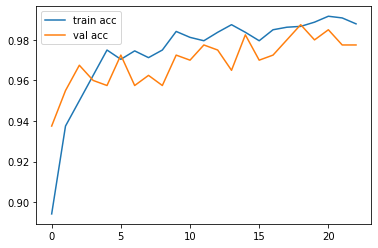

In [19]:
plt.plot(history.history['acc'], label='train acc')

plt.plot(history.history['val_acc'], label='val acc')

plt.legend()

plt.savefig('vgg-acc-rps-1.png')

plt.show()

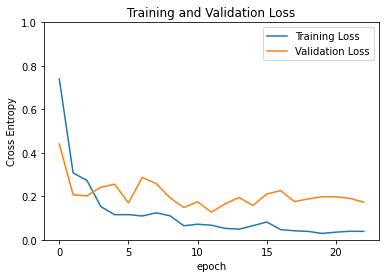

In [20]:
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [21]:
loss0, accuracy0 = model.evaluate(test_set)

38/38 [==============================] - 7s 167ms/step - loss: 0.2263 - acc: 0.9633


In [29]:
model.save(pma_dir+'/'+'max_pooling_resnet.h5')

In [28]:
pma_dir = "/content/drive/My Drive/PMA"

In [ ]:
samples = []

list_of_files = sorted( filter( lambda x: os.path.isfile(os.path.join(pma_dir, x)),
                        os.listdir(pma_dir) ) )
for file in list_of_files : 
  if file.endswith('.jpg') or file.endswith('.png'):
    samples.append(file)

In [ ]:
samples[:5]

['0008255f72057dbf97e229199e6595e2deebecfd.jpg',
 '000ae4b433acb21229b17679d28f9a148fad3429.jpg',
 '001dee6bb8c2280e1182e11d5fb87f5a5272753b.jpg',
 '0023593bc7d99ef1dded8b21ab9e61214e86cfd6.jpg',
 '003006be00fa0b45687c9413ba52fea04b7dac9b.jpg']

In [ ]:
import os
os.chdir(pma_dir)

In [ ]:
def get_prediction(file, model):
    # get l'image  224x224 
    img = load_img(file, target_size=(224,224))
    # convertir l'image en numpy
    img = np.array(img) 
    # batch_size = 1, taille = 224x224 , channel = 3
    reshaped_img = img.reshape(1,224,224,3) 
    # passage vers le modele
    imgx = preprocess_input(reshaped_img)
    # get le vecteur de feature
    prediction = model.predict(imgx, use_multiprocessing=True)
    return prediction

In [ ]:

data = {}

for img in samples:
  pred = get_prediction(img,model)
  data[img] = np.argmax(pred) 





In [ ]:
len(data)

3095

In [ ]:
data['0008255f72057dbf97e229199e6595e2deebecfd.jpg']

0

In [ ]:
def class_groups(data): 
  groups = {}
  for file, cluster in zip(samples,data):
      if cluster not in groups.keys():
          groups[cluster] = []
          groups[cluster].append(file)
      else:
          groups[cluster].append(file)
  return groups 

In [ ]:
groups = class_groups(list(data.values()))

In [ ]:
def view_cluster(cluster):
    plt.figure(figsize = (25,25));
    files = groups[cluster]
    
    # Afficher chaque image dans son cluster 
    for index, file in enumerate(files):
        plt.subplot(10,10,index+1);
        img = load_img(file)
        img = np.array(img)
        plt.imshow(img)
        plt.axis('off')

ValueError: ignored

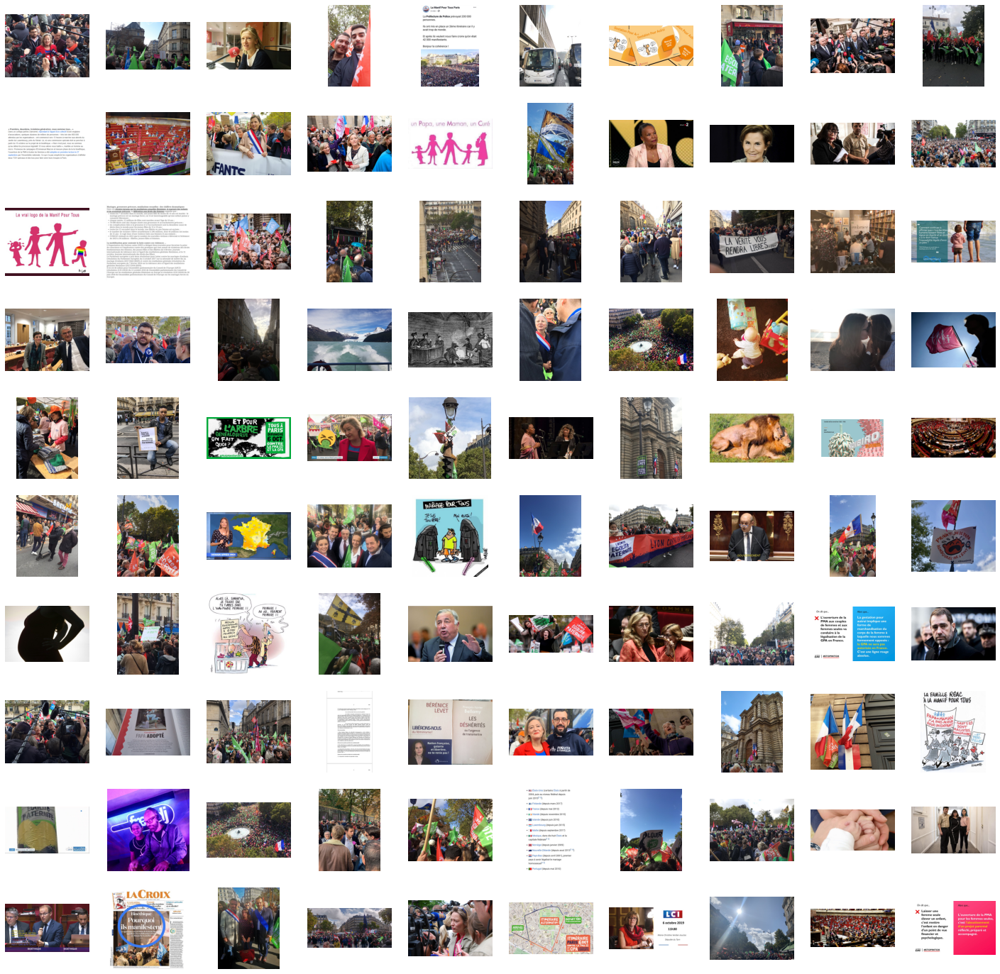

In [ ]:
view_cluster(0)

In [ ]:
f = open('pma_class_3.txt','w')
f.write(str(groups.values()))
f.close()

ValueError: ignored

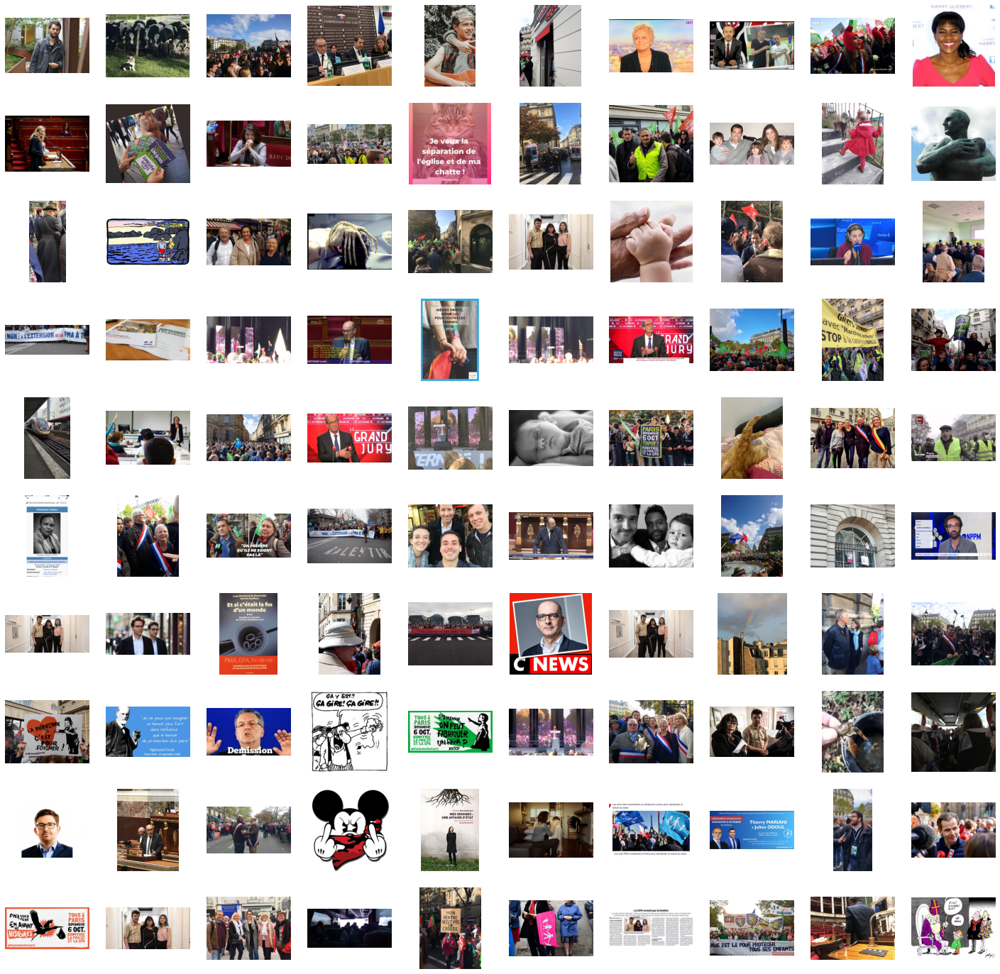

In [ ]:
view_cluster(1)

ValueError: ignored

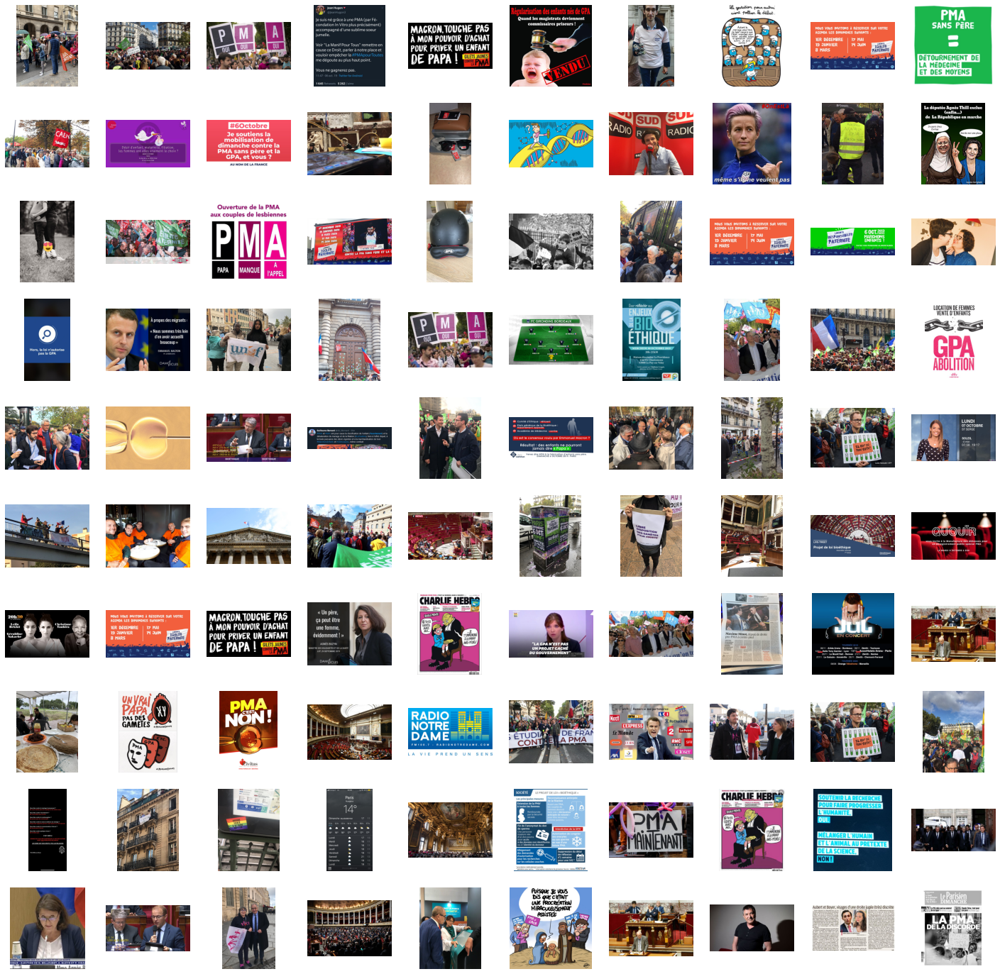

In [ ]:
view_cluster(2)

ValueError: ignored

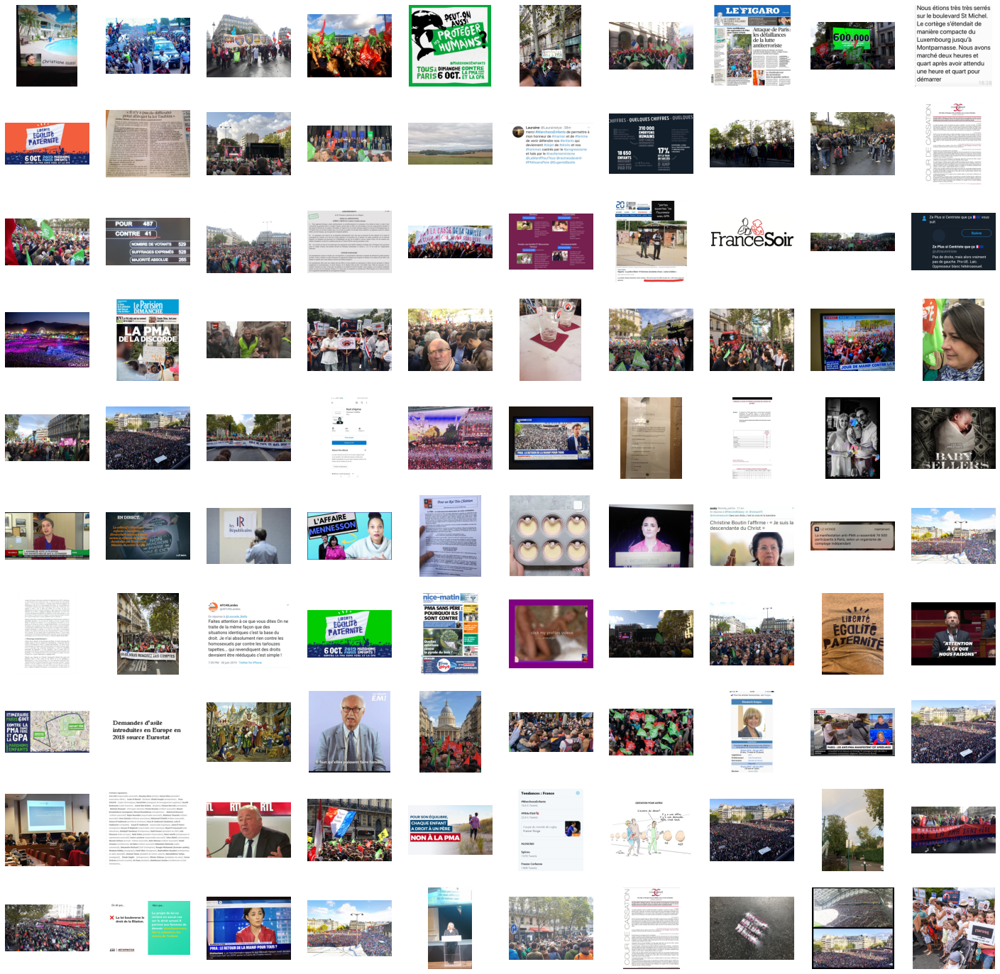

In [ ]:
view_cluster(3)

In [ ]:
len(groups.keys())

4